In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [13]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b',
                 'L6a': '#ffc0cb',
                 'L6b': '#fa9284'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/human/')
file_list

['human_759', 'human_j12', 'human_j3', 'human_j4', 'human_j6']

In [6]:
file = 'human_j3'

In [7]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAAGTATCTCCCA-1,WM
AAACACCAATAACTGC-1,L3
AAACAGGGTCTATATT-1,L1
AAACAGTGTTCCTGGG-1,L6b
AAACATTTCCCGGATT-1,WM


In [8]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/human/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\human\human_j3\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
adata.obs.label.notna().value_counts()

True    2925
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [10]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

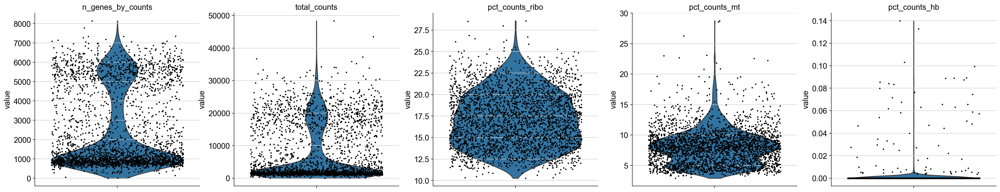

In [11]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

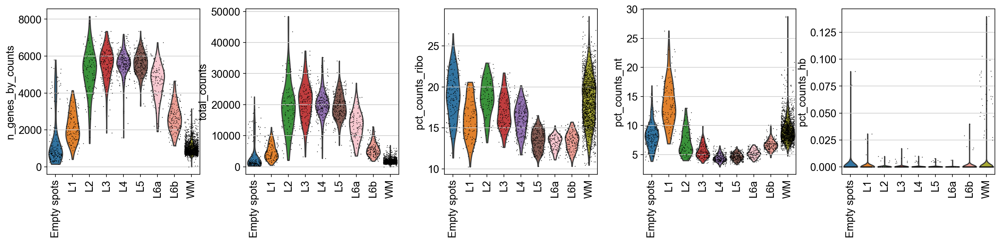

In [14]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1` и `WM` слоёв. А так же Число процент митохондриальных генов завышен в `L1` слое. Поэтому хотелось бы быть с ними аккуратнее. Хочется заметить высокий процент рибосомальных генов в `L2` и `WM`

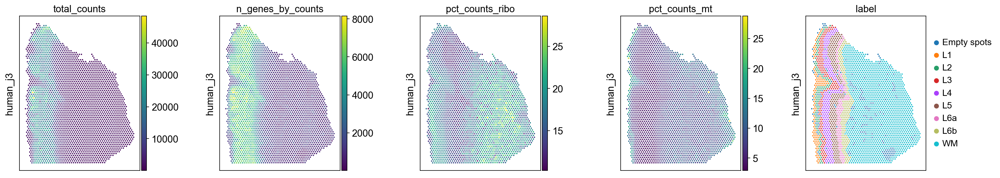

In [15]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

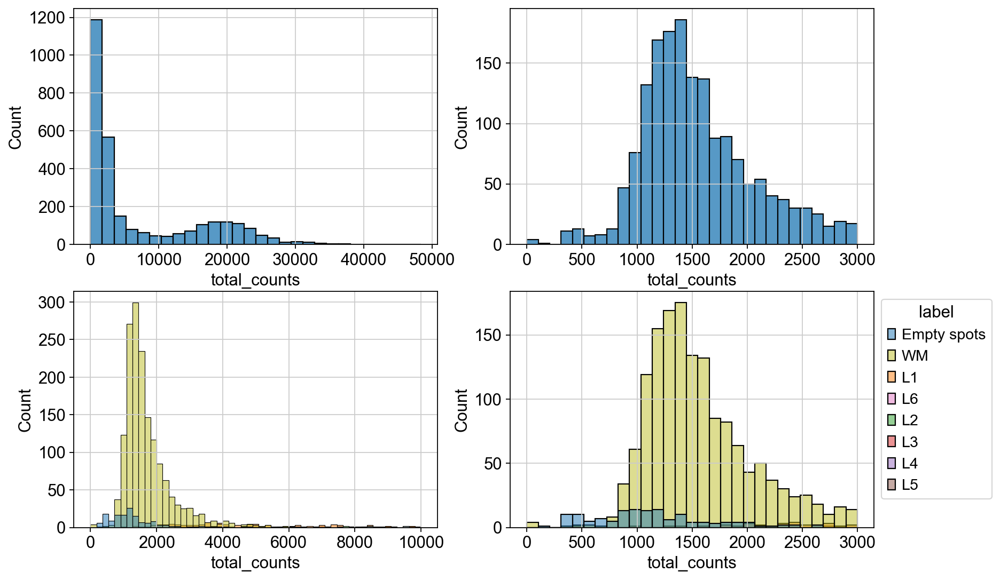

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 10000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из белого вещества. Посмотрим на остальные споты

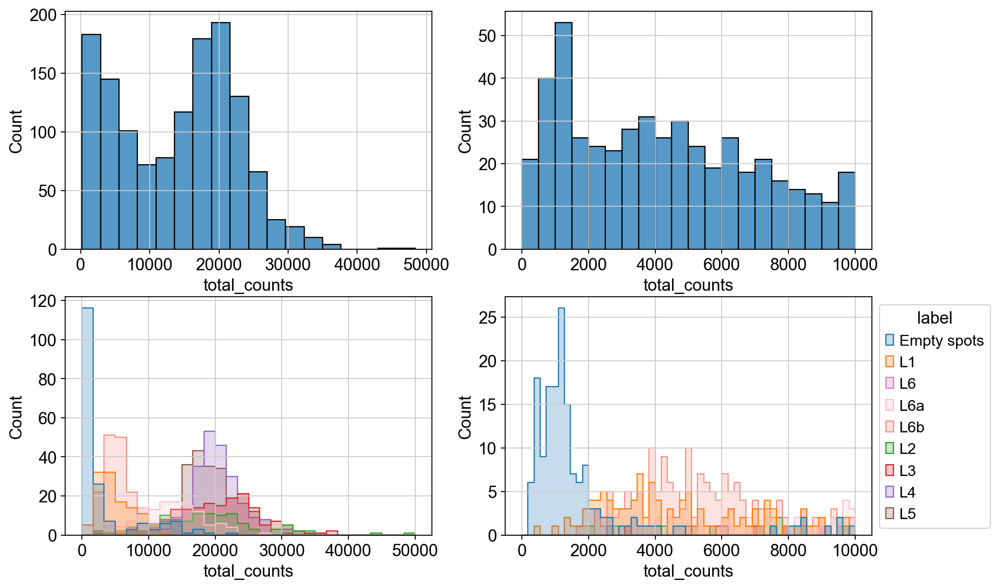

In [17]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'L6', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'WM'], x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 50000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette, fill=True, element="step")
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'WM'], bins=20, x='total_counts', binrange=[0, 10000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 10000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [18]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts')

median = 2159.0, [-19323.86083984375, 23641.86083984375]


Выберем порог по `total_counts = 950` для `WM` и `total_counts = 2000` для остальных.

In [20]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 950) & (adata.obs.label == 'WM')) |
                            ((adata.obs['total_counts'] > 2000) & (adata.obs['total_counts'] < 36000))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=201

label
Empty spots    129
WM              57
L1               9
L2               2
L3               2
L6b              2
Name: label, dtype: int64


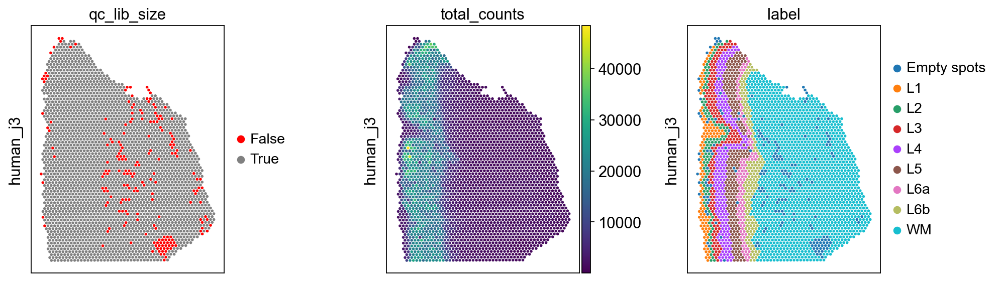

In [21]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

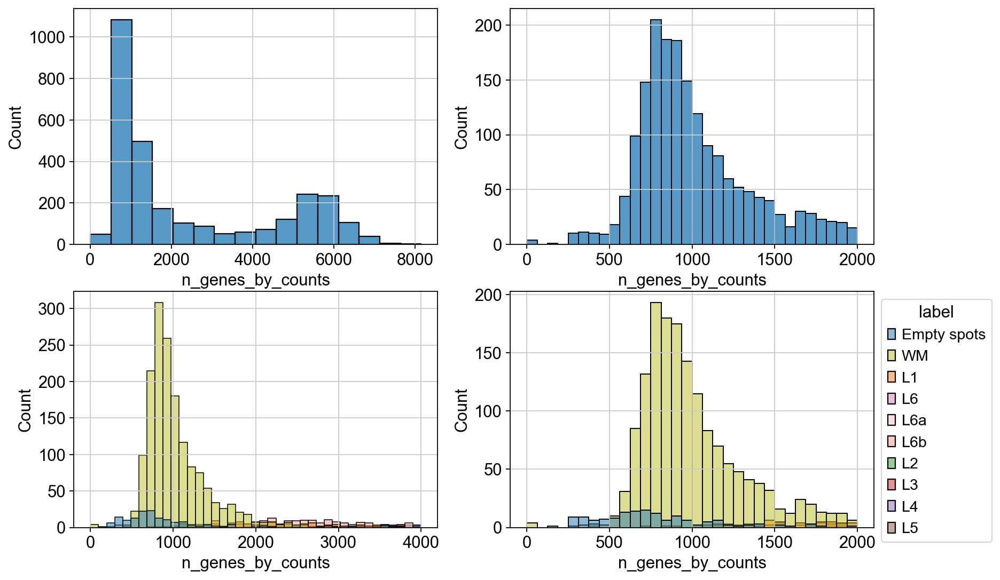

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из белого вещества. Посмотрим на остальные споты

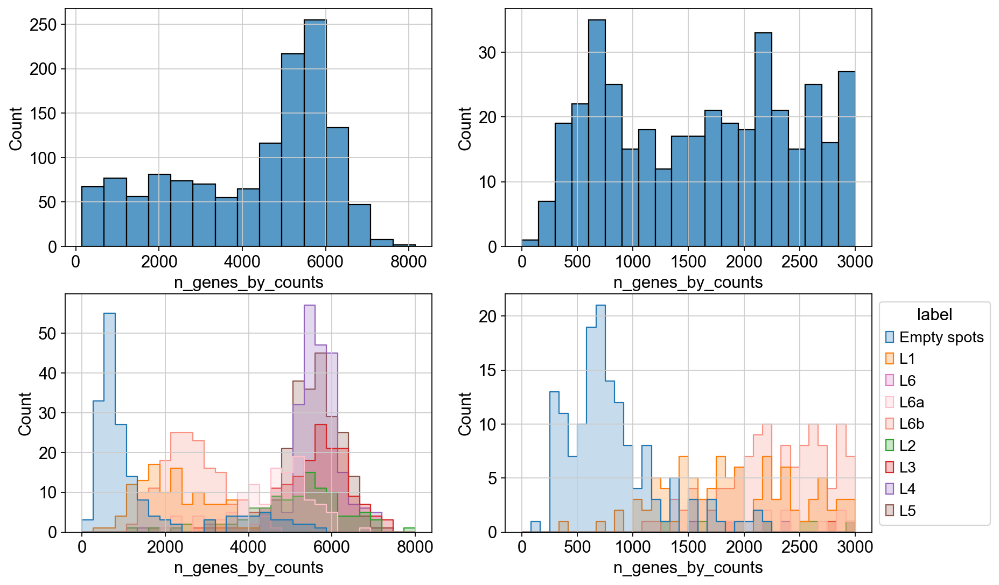

In [26]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'L6', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'WM'], x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 8000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette, fill=True, element="step")
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'WM'], bins=20, x='n_genes_by_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 3000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total n_genes_by_counts = 1000`. Поставим порог для `WM` и для всех остальных по отдельности

In [28]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 1200) & (adata.obs.label != 'WM'))
                           | ((adata.obs['n_genes_by_counts'] > 600) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=179

label
Empty spots    129
WM              37
L1              11
L6b              2
Name: label, dtype: int64


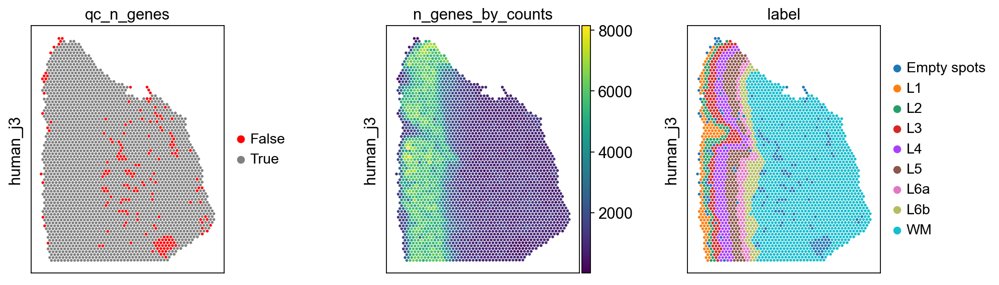

In [29]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

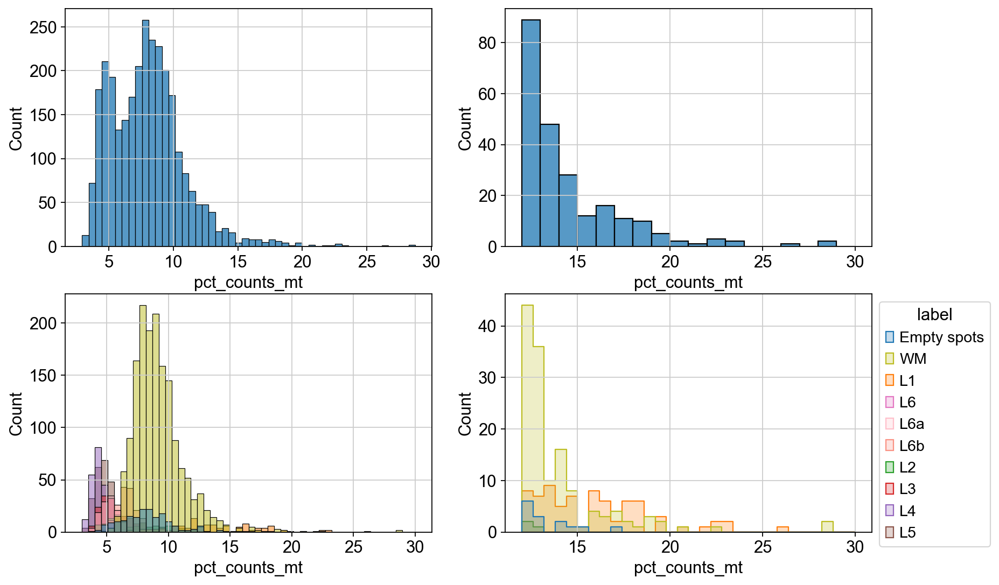

In [30]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']


sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[3, 30], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[12, 30], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[12, 30], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `pct_counts_mt = 20`

In [33]:
adata.obs['qc_mt'] = ((adata.obs['pct_counts_mt'] <= 20)).astype('string')
#adata.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=11

label
L1    7
WM    4
Name: label, dtype: int64


### Proportion of ribosomal reads

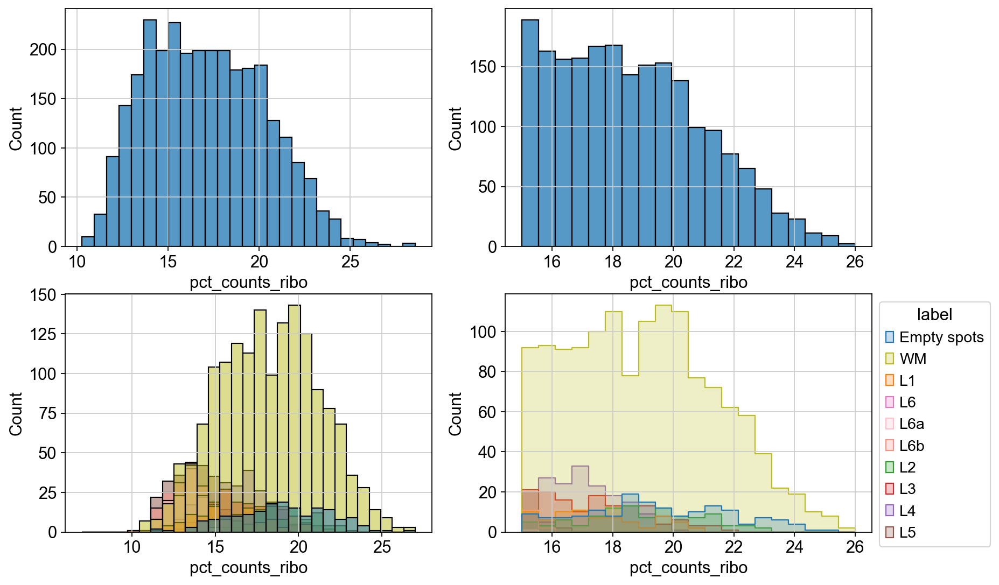

In [35]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 27], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[15, 26], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[15, 26], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD

In [36]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_ribo')

median = 16.913318634033203, [8.905949115753174, 24.920688152313232]


Выберем порог `pct_counts_ribo = 23`

In [39]:
adata.obs['qc_ribo'] = ((adata.obs['pct_counts_ribo'] <= 23)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=102

label
WM             86
Empty spots    16
Name: label, dtype: int64


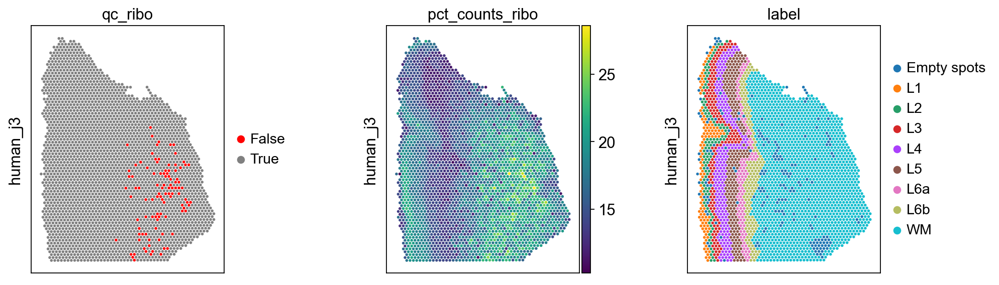

In [40]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

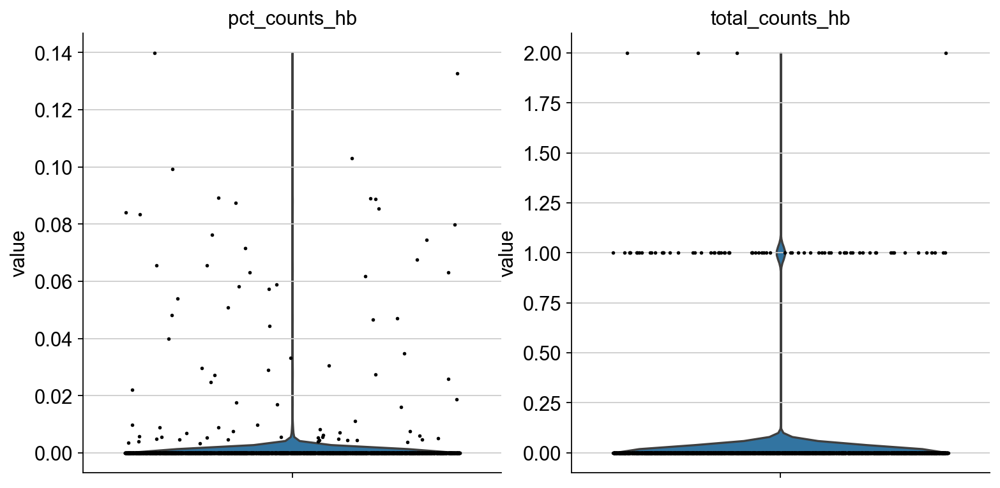

In [41]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Тут всё хорошо

## Combined

### QC spatial_scatter

In [43]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)
adata.obs['qc_ribo'] = adata.obs['qc_ribo'].astype(object).replace(d)

In [45]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes *
                              adata.obs.qc_mt * adata.obs.qc_ribo).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=295

label
WM             141
Empty spots    131
L1              17
L2               2
L3               2
L6b              2
Name: label, dtype: int64


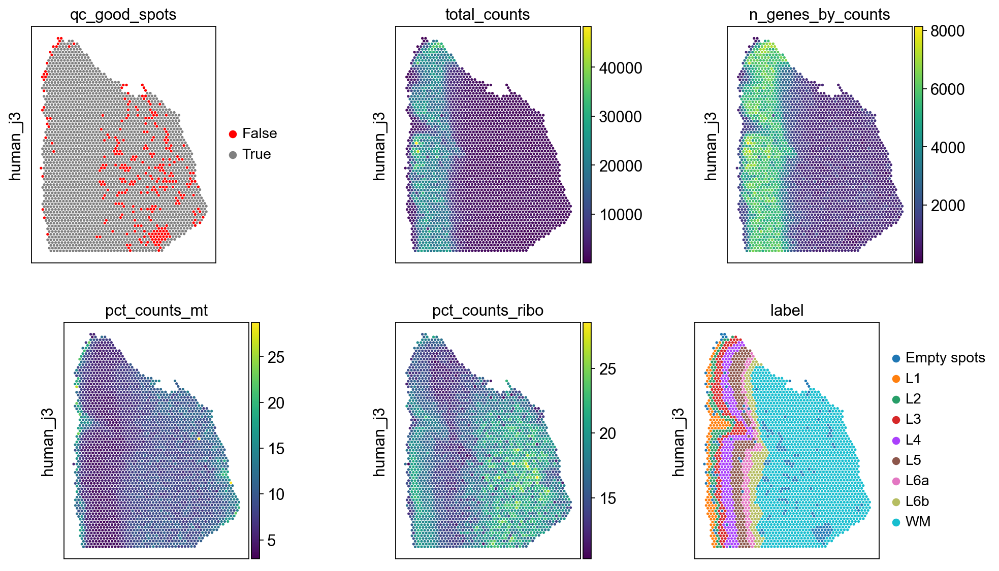

In [47]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

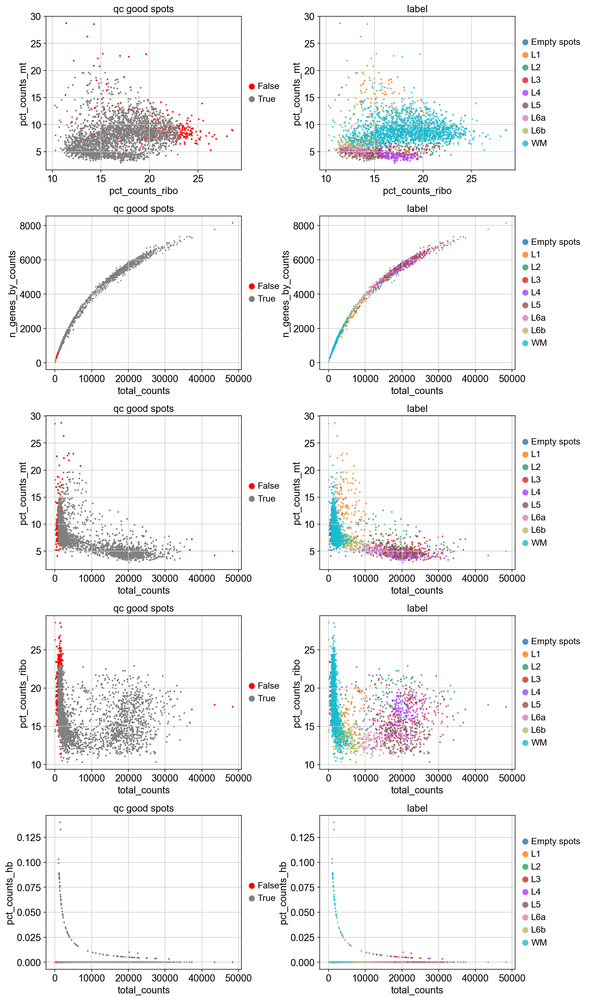

In [48]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

Гипербола образована образцами с одинаковым `total_counts_hb`

### Cохраним отфильтрованые споты (без пустых)

In [49]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [50]:
adata_filtered = adata[good_spots].copy()

### PCA

In [51]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:24)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


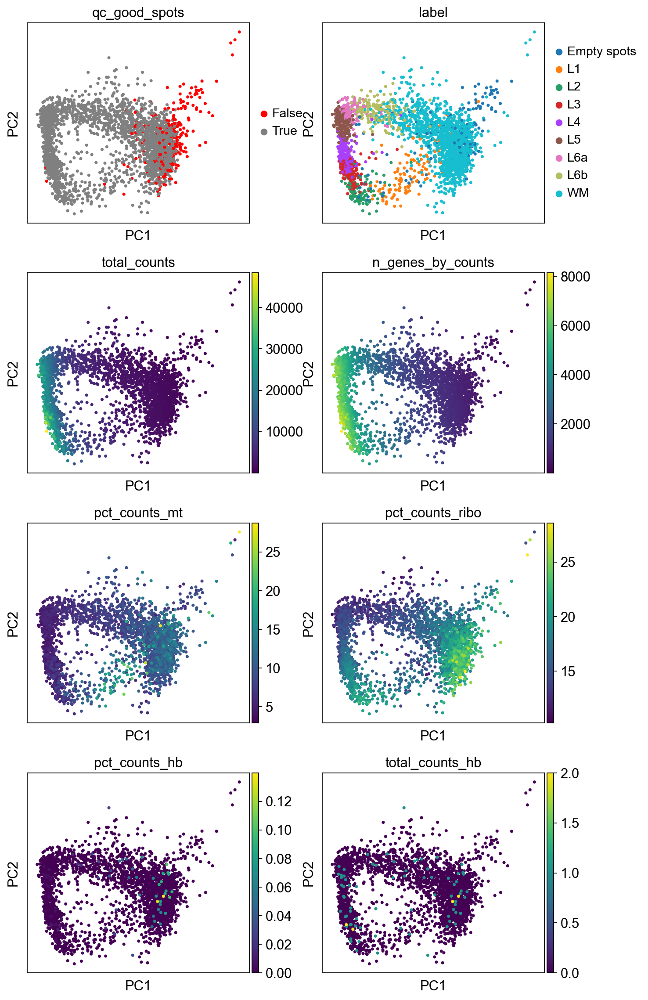

In [52]:
sc.pl.pca(adata, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=2, show=True)

## Сохраним в .h5ad

In [54]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt', 'qc_ribo'], axis=1, inplace=True)

In [55]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAAGTATCTCCCA-1,1,50,102,WM,human_j3,646,993.0,157.0,15.810675,0.0,0.0,136.0,13.695871
AAACACCAATAACTGC-1,1,59,19,L3,human_j3,5804,22753.0,1233.0,5.419066,0.0,0.0,4112.0,18.072342
AAACAGGGTCTATATT-1,1,47,13,L1,human_j3,4135,12701.0,1267.0,9.975593,0.0,0.0,2613.0,20.573183
AAACAGTGTTCCTGGG-1,1,73,43,L6b,human_j3,2605,5433.0,393.0,7.233573,0.0,0.0,677.0,12.460888
AAACATTTCCCGGATT-1,1,61,97,WM,human_j3,994,1641.0,133.0,8.104814,0.0,0.0,355.0,21.633152


In [56]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/human', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/human/{file}.h5ad')